Hello! 

My name is Brandon Wolfe. I am an applicant as a data scientist in the ELSYS portfolio. 

To prepare for Friday's interview and by way of introduction, I put together a short python notebook demonstrating the visualization of flight test data. It derives from reading and listening to work by Luke Starnes, chief ELSYS engineer of GTRI Atlanta.

I will begin by loading in the needed packages. I enjoy the interactivity that Jupyter notebooks provide and I use them frequently. My development environment is managed by conda and I tend to work on linux boxes, since I often run code on remote computers.

In [25]:
import requests
import os
import sys
from http.client import responses

In [55]:
import os
import pandas as pd
import datashader as ds
import datashader.transfer_functions as tf
from datashader.utils import export_image
from datashader.colors import viridis
import colorcet as cc
import matplotlib.pyplot as plt

import dask.dataframe as dd
import datetime as dt
from IPython.core.display import display, HTML
import numpy as np
from requests import get
from json import loads
from pandas import Series
from pandas.io.json import json_normalize
import urllib.request
import json

# Description of the Dataset

The Automatic Dependent Surveillance-Broadcast (ADS-B) system is an alternative to air traffic control via radar. In it, an aircraft determines its position via satellite navigation and then broadcasts it at least once per second. The ADSB-B exchange API makes these data publicly available.

Following Luke Starnes at GTRI (1), I will download some of these data and demonstrate some elementary statistical and visualization techniques for flight test data.

(1) Starnes, Luke. Notebooks for ADS-B talk given in October 2018 to SFTE. GitHub. https://github.com/slstarnes/sfte2018-adsb/tree/master 

Here, I download compressed files containing half a million ADS-B signals. This dataset contains only the manufacturer, ICAO airport code, ICAO aircraft type, and operator.

In [72]:
h5_file = '2018-06-16.h5-500000.p'
df = pd.read_pickle(h5_file)

In [73]:
df

,Man,Icao,Type,Op
0,NaN,A939E8,NaN,NaN
1,Raytheon Aircraft Company,A3286B,BE40,"MOSER AVIATION LLC - ENGLEWOOD, CO"
2,NaN,A4E80D,NaN,"RYAN BEDROSIAN LLC - REDWOOD CITY, CA"
3,Boeing,AB1FFE,B739,Delta
4,NaN,A6329D,NaN,FedEx
...,...,...,...,...
6525,Bombardier,C06361,DH8D,Porter Airlines
6526,Airbus,3C662C,A320,Germanwings
6527,Embraer,A24082,E170,SkyWest
6528,NaN,AA2A7F,CRJ7,SkyWest


# Some simple statistics

Counting the ADSB signals by manufacturer reveals that most of the planes in the air that day were made by Boeing.

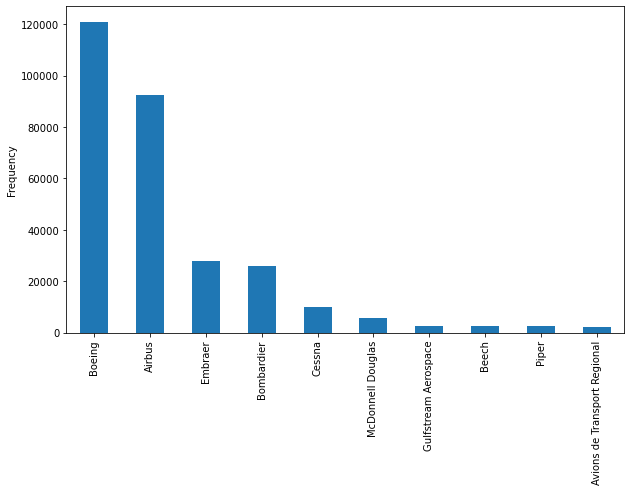

In [74]:
fig,ax = plt.subplots(figsize=(10,6))
df['Man'].value_counts()[:10].plot(ax = ax, kind = 'bar', ylabel = 'Frequency')
plt.show()

We can also break down the planes in the sky by their type and operator. (Incdentally, I believe the similar line of code from Luke Starnes has a bug.)

In [93]:
most_frequent_planes = list(df.Type.value_counts().index[:10])
most_frequent_ops = list(df.Op.value_counts().index[:10])
dense_planes = df[df.Type.isin(most_frequent_planes)]
dense_ops = dense_planes[dense_planes.Op.isin(most_frequent_ops)]

In [97]:
pd.crosstab(dense_ops.Type,dense_ops.Op, margins=True).iloc[:-1].sort_values('All', ascending=False)

Op,Air Canada,American,Delta,JetBlue,SkyWest,Southwest,United,Virgin,Wells Fargo,All
Type,,,,,,,,,,
B738,0,6803,3286,0,0,9290,2343,2553,616,24891
B737,0,0,54,0,0,14712,1109,169,651,16695
A321,657,7345,3362,2802,0,0,0,0,57,14223
A320,2152,1287,1315,3823,0,0,2579,2056,344,13556
A319,1328,2324,974,0,0,0,2360,227,471,7684
B739,0,0,3599,0,0,0,3932,0,25,7556
CRJ9,838,386,2387,0,441,0,0,0,1395,5447
E170,1142,1742,426,0,685,0,1187,0,52,5234
E75L,0,547,784,0,272,0,2346,0,0,3949


# Visualization

Datashader is a great tool for plotting large numbers of data points. Here, I load and visualize the ADSB signals from within the continental US on a particular day. Datashader plots each data point as a pixel, then colors it by pixel density.

In [27]:
def spread(pts):
    return ((pts[0][1] - pts[0][0]),
            (pts[1][1] - pts[1][0]))
def ratio(pts):
    s = spread(pts)
    x, y = s
    return x / y

In [59]:
USA = ((-13884029, -7453304), (2698291, 6455972))

In [61]:
def using_datashader(ax, x, y,mycmap):

    df = pd.DataFrame(dict(x=x, y=y))
    dsartist = dsshow(
        df,
        ds.Point("x", "y"),
        ds.count(),
        vmin=0,
        vmax=20,
        norm="linear",
        aspect="auto",
        ax=ax,
        cmap=mycmap
    )

In [64]:
import datashader as ds
from datashader.mpl_ext import dsshow

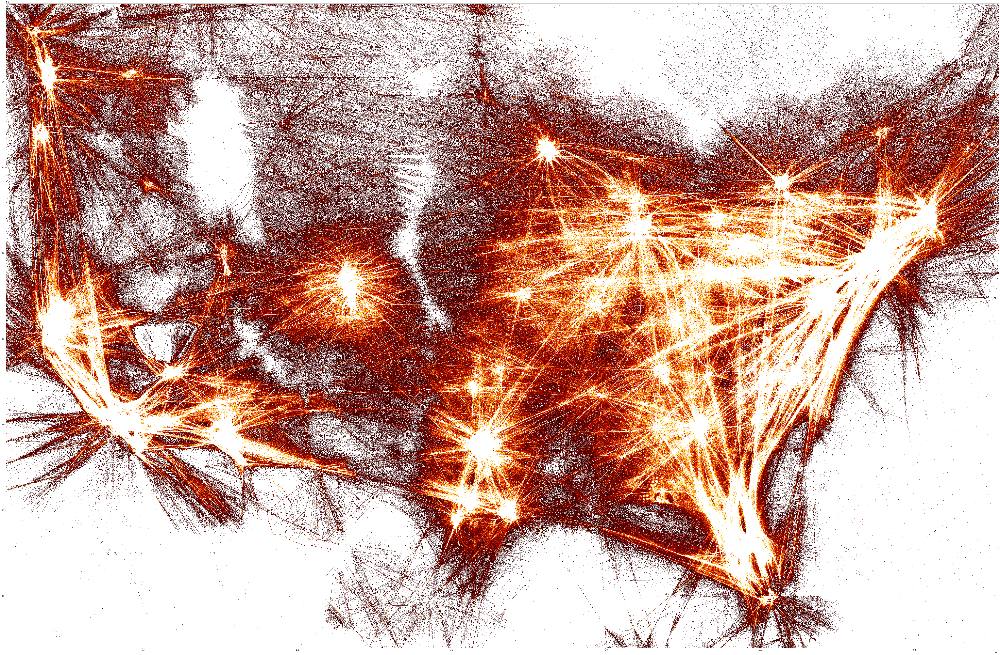

In [65]:
fig = plt.figure(figsize=(90,60))
fig.tight_layout()
ax1 = plt.subplot(111)

using_datashader(ax1, df.x,df.y, cc.fire)

This visualization shows areas with high air traffic (white), as well as less traffic (red) and locations with no ADS-B ground support (white).